# Box plots feautures percentil

Categorical analysis - all features are transformed into categorical variables

All feautures are categorical values and target is discrete

In [1]:
import os
# fix root path to save outputs
actual_path = os.path.abspath(os.getcwd())
list_root_path = actual_path.split('\\')[:-1]
root_path = '\\'.join(list_root_path)
os.chdir(root_path)
print('root path: ', root_path)

root path:  D:\github-mi-repo\exploratory-data-analysis


### 0. Package and load data

In [2]:
from sklearn.datasets import fetch_california_housing
import json
import pandas as pd
import numpy as np

# plotly
import plotly
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots

#### load data categorical features and target generated by percentiles
This is generated in the notebook 0

In [3]:
data_percentile_feature_target = pd.read_pickle('data/df_cat_feature_target.pkl')
data_percentile_feature_target.head()

,quartile_MedInc,quartile_HouseAge,quartile_AveRooms,quartile_AveBedrms,quartile_Population,quartile_AveOccup,quartile_Latitude,quartile_Longitude,quartile_Price
0,q4 - (4.74-15.0),q4 - (37.0-52.0),q4 - (6.05-141.91),q2 - (1.01-1.05),q1 - (3.0-787.0),q2 - (2.43-2.82),q4 - (37.71-41.95),q1 - (-124.35--121.8),q4 - (2.65-5.0)
1,q4 - (4.74-15.0),q2 - (18.0-29.0),q4 - (6.05-141.91),q1 - (0.33-1.01),q4 - (1725.0-35682.0),q1 - (0.69-2.43),q4 - (37.71-41.95),q1 - (-124.35--121.8),q4 - (2.65-5.0)
2,q4 - (4.74-15.0),q4 - (37.0-52.0),q4 - (6.05-141.91),q3 - (1.05-1.1),q1 - (3.0-787.0),q2 - (2.43-2.82),q4 - (37.71-41.95),q1 - (-124.35--121.8),q4 - (2.65-5.0)
3,q4 - (4.74-15.0),q4 - (37.0-52.0),q3 - (5.23-6.05),q3 - (1.05-1.1),q1 - (3.0-787.0),q2 - (2.43-2.82),q4 - (37.71-41.95),q1 - (-124.35--121.8),q4 - (2.65-5.0)
4,q3 - (3.53-4.74),q4 - (37.0-52.0),q4 - (6.05-141.91),q3 - (1.05-1.1),q1 - (3.0-787.0),q1 - (0.69-2.43),q4 - (37.71-41.95),q1 - (-124.35--121.8),q4 - (2.65-5.0)


#### load data categorical only features generated by percentiles
This is generated in the notebook 0

In [7]:
data_percentile_feature = pd.read_pickle('data/df_cat_feature.pkl')
data_percentile_feature.head()

,Price,quartile_Latitude,quartile_Population,quartile_HouseAge,quartile_Longitude,quartile_AveOccup,quartile_AveRooms,quartile_MedInc,quartile_AveBedrms
0,4.526,q4 - (37.71-41.95),q1 - (3.0-787.0),q4 - (37.0-52.0),q1 - (-124.35--121.8),q2 - (2.43-2.82),q4 - (6.05-141.91),q4 - (4.74-15.0),q2 - (1.01-1.05)
1,3.585,q4 - (37.71-41.95),q4 - (1725.0-35682.0),q2 - (18.0-29.0),q1 - (-124.35--121.8),q1 - (0.69-2.43),q4 - (6.05-141.91),q4 - (4.74-15.0),q1 - (0.33-1.01)
2,3.521,q4 - (37.71-41.95),q1 - (3.0-787.0),q4 - (37.0-52.0),q1 - (-124.35--121.8),q2 - (2.43-2.82),q4 - (6.05-141.91),q4 - (4.74-15.0),q3 - (1.05-1.1)
3,3.413,q4 - (37.71-41.95),q1 - (3.0-787.0),q4 - (37.0-52.0),q1 - (-124.35--121.8),q2 - (2.43-2.82),q3 - (5.23-6.05),q4 - (4.74-15.0),q3 - (1.05-1.1)
4,3.422,q4 - (37.71-41.95),q1 - (3.0-787.0),q4 - (37.0-52.0),q1 - (-124.35--121.8),q1 - (0.69-2.43),q4 - (6.05-141.91),q3 - (3.53-4.74),q3 - (1.05-1.1)


In [13]:
### DEFINE DATA TO USE
data = data_percentile_feature.copy()

### define list of features target discrete continous

In [9]:
# ##### features
# # list original features
# list_features_original= ['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup', 'Latitude', 'Longitude', 'Price']

# # list transformation percentile each feature
# list_features_percentile_transformation = ['quartile', 'quartile', 'quartile', 'quartile', 'quartile', 'quartile', 'quartile', 'quartile', 'quartile']

# ##### target
# list_target_original = ['Price']
# list_target_percentile_transformation = ['quartile']

In [10]:
# # get the list of feature and target used to this analysis. 
# ### ----> features discrete. target continous
# list_features_discrete = [list_features_percentile_transformation[index]+'_'+list_features_original[index] \
#                           for index in range(len(list_features_original))]

# list_target_continous = list_target_original

# print('list_features: ', list_features_discrete)
# print('\nlist_target: ', list_target_continous)

### 1. codes to eda
for each feature, plot a boxplot of the distribution of continuos target

In [11]:
target = 'Price'

In [15]:
data.head()

,Price,quartile_Latitude,quartile_Population,quartile_HouseAge,quartile_Longitude,quartile_AveOccup,quartile_AveRooms,quartile_MedInc,quartile_AveBedrms
0,4.526,q4 - (37.71-41.95),q1 - (3.0-787.0),q4 - (37.0-52.0),q1 - (-124.35--121.8),q2 - (2.43-2.82),q4 - (6.05-141.91),q4 - (4.74-15.0),q2 - (1.01-1.05)
1,3.585,q4 - (37.71-41.95),q4 - (1725.0-35682.0),q2 - (18.0-29.0),q1 - (-124.35--121.8),q1 - (0.69-2.43),q4 - (6.05-141.91),q4 - (4.74-15.0),q1 - (0.33-1.01)
2,3.521,q4 - (37.71-41.95),q1 - (3.0-787.0),q4 - (37.0-52.0),q1 - (-124.35--121.8),q2 - (2.43-2.82),q4 - (6.05-141.91),q4 - (4.74-15.0),q3 - (1.05-1.1)
3,3.413,q4 - (37.71-41.95),q1 - (3.0-787.0),q4 - (37.0-52.0),q1 - (-124.35--121.8),q2 - (2.43-2.82),q3 - (5.23-6.05),q4 - (4.74-15.0),q3 - (1.05-1.1)
4,3.422,q4 - (37.71-41.95),q1 - (3.0-787.0),q4 - (37.0-52.0),q1 - (-124.35--121.8),q1 - (0.69-2.43),q4 - (6.05-141.91),q3 - (3.53-4.74),q3 - (1.05-1.1)


### 2. sinthetize

#### individual

In [23]:
def plot_individual_hist_categorical(df, var_categorical, var_continuous_hist):
    """
    Plot individual hist of a variable (target in this example) colored by different categories of a variable
    Args
        df (dataframe): input dataframe
        var_categorical (string): name of the column in the input dataframe that indicate the differents categories in the data
        var_continuous_hist (string): name of the feature in the input dataframe that will plot its histogram

    Return
        fig (figure plotly): fig of plotly with the plot generated
    """
    
    fig = px.histogram(df, x = var_continuous_hist, color = var_categorical, barmode='overlay', opacity=0.4)

    # update title
    fig.update_layout(
      title_text = f'Histogram: {var_continuous_hist} by percentil of {var_categorical}',
      title_x = 0.5, # centrar titulo
      title_font = dict(size = 20)
    )
    return fig

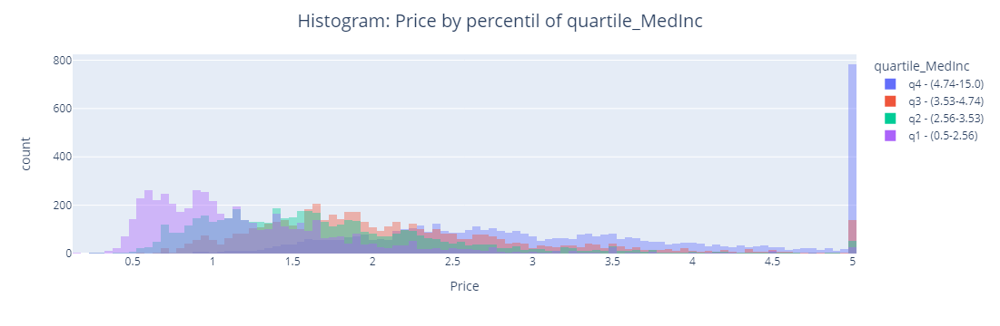

In [24]:
feature_cat_ = 'quartile_MedInc'
fig_individual_hist = plot_individual_hist_categorical(df = data, 
                                              var_continuous_hist = target, 
                                               var_categorical = feature_cat_)

fig_individual_hist.show()

fig_individual_hist.write_html("output_eda/5_categorical_analysis/individual_histogram.html")

In [30]:
def plot_individual_boxplot_categorical(df, var_categorical, var_continuous_hist):
    """
    Plot individual boxplot of a variable (target in this example) colored by different categories of a variable
    Args
        df (dataframe): input dataframe
        var_categorical (string): name of the column in the input dataframe that indicate the differents categories in the data
        var_continuous_hist (string): name of the feature in the input dataframe that will plot its histogram

    Return
        fig (figure plotly): fig of plotly with the plot generated
    """
    fig = go.Figure()
    fig.add_trace(go.Box(x=df[var_categorical], y=df[var_continuous_hist]))

    # update title
    fig.update_layout(
      title_text = f'Histogram: {var_continuous_hist} by percentil of {var_categorical}',
      title_x = 0.5, # centrar titulo
      title_font = dict(size = 20)
    )
    return fig

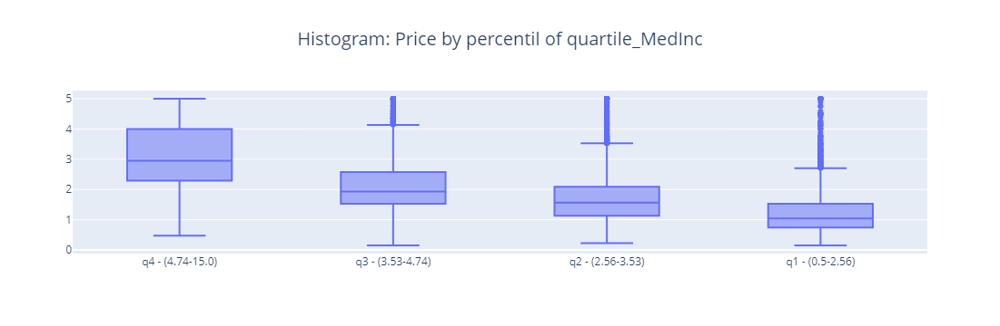

In [31]:
feature_cat_ = 'quartile_MedInc'
fig_individual_boxplot = plot_individual_boxplot_categorical(df = data, 
                                              var_continuous_hist = target, 
                                               var_categorical = feature_cat_)

fig_individual_boxplot.show()

fig_individual_boxplot.write_html("output_eda/5_categorical_analysis/individual_histogram.html")

#### subplots

In [41]:
def plot_boxplots_categorical(df, var_continuous_hist, number_columns = 2):
    """
    Plot multiple boxplots for each feature in the dataframe.Each feature is categorical and plot the values of a continous variable 
    Differents colors in the histogram according the segmentation in the data
    
    Args
        df (datafame): input dataframe
        var_continuous_hist (string): name of the feature in the input dataframe that will plot its histogram

    Return
        fig (figure plotly): fig of plotly with the plot generated
    """
    # get list features
    list_features_target = df.columns.tolist()
    list_features = list(set(list_features_target) - set([var_continuous_hist]))


    # get number of rows (number row = number of data / number of columns)
    # (considering fixed the number of columns) 
    if (df.shape[1] % number_columns) != 0:
        number_rows = (df.shape[1] // number_columns) + 1 
    else:
        number_rows = (df.shape[1] // number_columns)


    ############################## 
    # Create los subplots
    fig = make_subplots(rows = number_rows, cols = number_columns, shared_xaxes=False, subplot_titles=list_features)

    # add each boxplot
    for index_feature, feature in enumerate(list_features):

        # obtener índices en el subplot (en plotly los índices comienzan en 1, por lo que debe sumarse un 1 a los resultados obtenidos)
        row = (index_feature // number_columns) + 1
        column = (index_feature % number_columns) + 1
        
        # add trace boxplot
        fig.add_trace(go.Box(x=df[feature], y=df[var_continuous_hist]),
                row = row,
                col = column)
        fig.update_yaxes(title_text = var_continuous_hist, row=row, col=column)
        
    # update layout
    fig.update_layout(height=len(list_features)*250, 
                      width=1600, 
                      title_text = "Boxplots of a target variable vs features categorized in percentil",
                      title_x = 0.5, # centrar titulo
                    title_font = dict(size = 28)
                     ) 
                     
    return fig

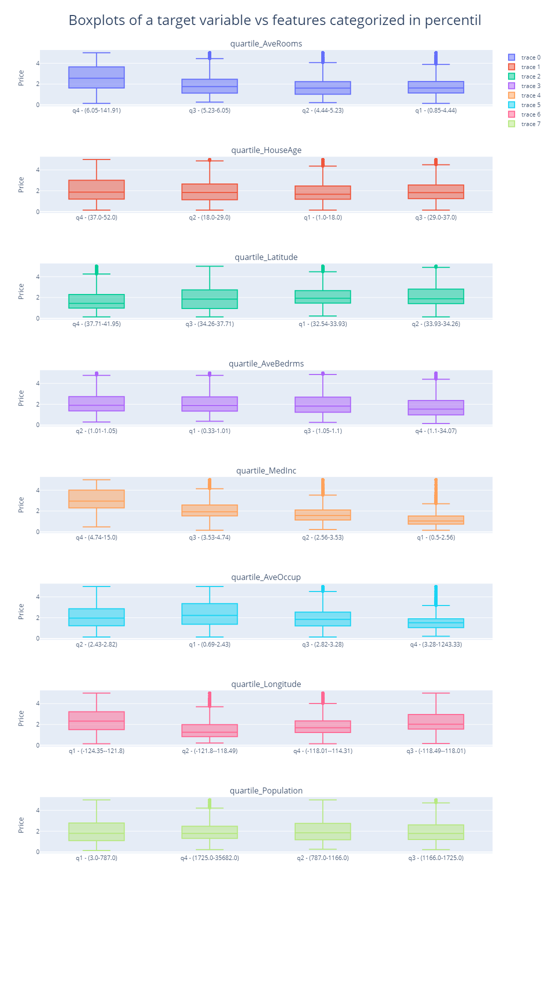

In [42]:
fig_boxplot_features_discrete = plot_boxplots_categorical(df = data, 
                                                          var_continuous_hist = target, 
                                                          number_columns = 1)

fig_boxplot_features_discrete.write_html("output_eda/5_categorical_analysis/boxplots_features_discrete.html")

fig_boxplot_features_discrete.show()